## Evolutionary Algo: 
optimization algos inspired by the principles of natural selection and genetics. They are used to find approximate solutions of complex problems. 

Types of Evolutionary Algorithms:

1-Genetic Algo: Use binary strings to represent solutions.  (Ex-travelling salesman prob solving)

2-Genetic Programminga: Evolve Computer programs (Ex Symbolic regression)

## Genetic Algorithm

Genetic Algorithm is one of the most fascinating optimization algorithms because it copies nature's evolution process.

Instead of asking:

"What is the answer?"

GA asks:

"Among millions of possible answers, which one is the best?"

This is exactly how nature works.

Nature does not design the perfect animal directly.

Instead:

Many individuals are born.

Strong individuals survive.

They reproduce.

Their children inherit good traits.

After many generations, the species becomes better adapted.

Genetic Algorithms apply the same idea to optimization problems.

The concept was introduced by John Holland in the 1970s.

## Why we need this algo ?

Suppose you want to find the maximum value of:

f(x)=x**2

for: 0≤x≤31 Simple problem.

But imagine instead:

Finding the best steel chemistry

Finding best furnace temperatures

Finding best route for 1000 cities

Finding best stock portfolio

Finding best neural network architecture

Now the number of combinations becomes enormous.

Example:

If you have 20 process variables and each can take 100 values:

possible combinations: 10**40

solutions.

Even supercomputers cannot try all possibilities.

GA searches intelligently.

In [1]:
# Biological Mapping
# Biology                 	Genetic Algorithm
# Gene	                    Single variable
# Chromosome	            One complete solution
# Population	            Group of solutions
# Fitness	                Quality of solution
# Selection	                Choosing best solutions
# Crossover	                Mixing parents
# Mutation	                Random change
# Generation	            Iteration

In [ ]:
# 1. Population:
# Population means: Collection of candidate solutions.

# Example: Suppose we want to maximize:
# f(x)=x**2 and x lies between 0 and 31.

# Initial population:
# Individual	Value
# A	             5
# B	             12
# C	             20
# D	             30

# Population size = 4


# 2. Chromosome
# A chromosome represents one complete solution.
# Example: x = 20
# This entire value is one chromosome.


# 3. Gene
# A chromosome consists of genes.
# Binary representation: 20 = 10100
# Genes:
# 1
# 0
# 1
# 0
# 0
# Each bit is a gene.


# 4. Fitness Function
# Fitness determines how good a solution is.
# Example:
# f(x)=x**2

# For: x=20

# fitness: 400

# For: x=30
# fitness: 900

# Higher fitness means better solution.


# 5. Selection: Selecting good parents for reproduction.

# Good solutions get higher probability.
# Similar to: Survival of the fittest.
## Roulette Wheel Selection (one of the methods):
## Pi= fitness_i / sum of fitness

# 6 Tournament:Pick random individuals (out of 5 choose 3)


# 7.Crossover: Parents exchange information. choose a crossover point

# Example: Father: 111|000

# Mother:  000|111

# Child 1: 111111

# Child 2: 000000

## Two crossover point:

## parent1: 101|001|01

## parent2: 110|110|10
## swap middle

## children: 10111001 and 11000110

## Uniform Crossover: Randomly swap every gene

# 8. Mutation: Randomly changing genes. ( Prevents getting stucl)
# Randomly flip one bit (tiny prob to flip the bit)
# Example: Before: 101100

# After mutation: 101000

# Mutation prevents getting stuck in local optimum.

## 9.Replacement: Children replace parents.Eventually best soln emerges
# gen 1 -> gen 2 -> gen 3



# 10. Generation:
# One complete cycle:

# Selection
# Crossover
# Mutation

# is called one generation.

## Biological inspiration

In [ ]:
#Population -> Individuals Compete -> Fittest survive -> 
#Parents Reproduce -> Children inherit Genes ->Random Mutation occurs
#-> Next generation ->repeat

## GA Workflow

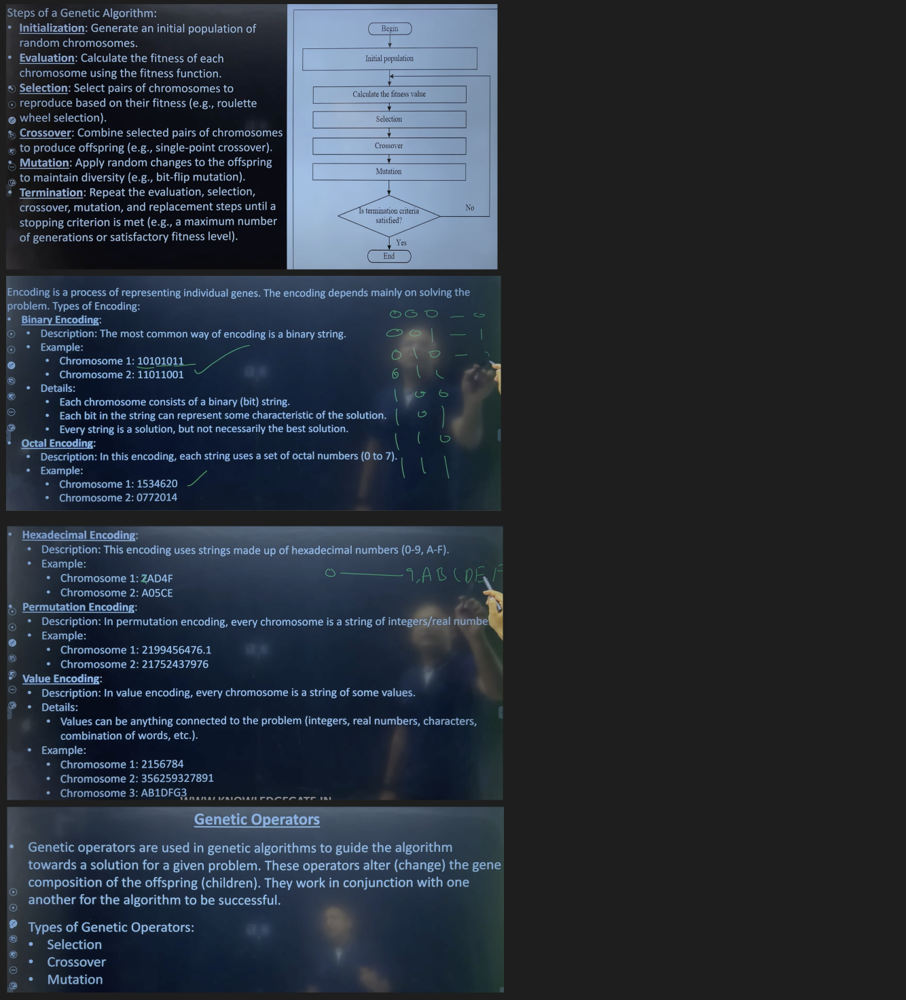

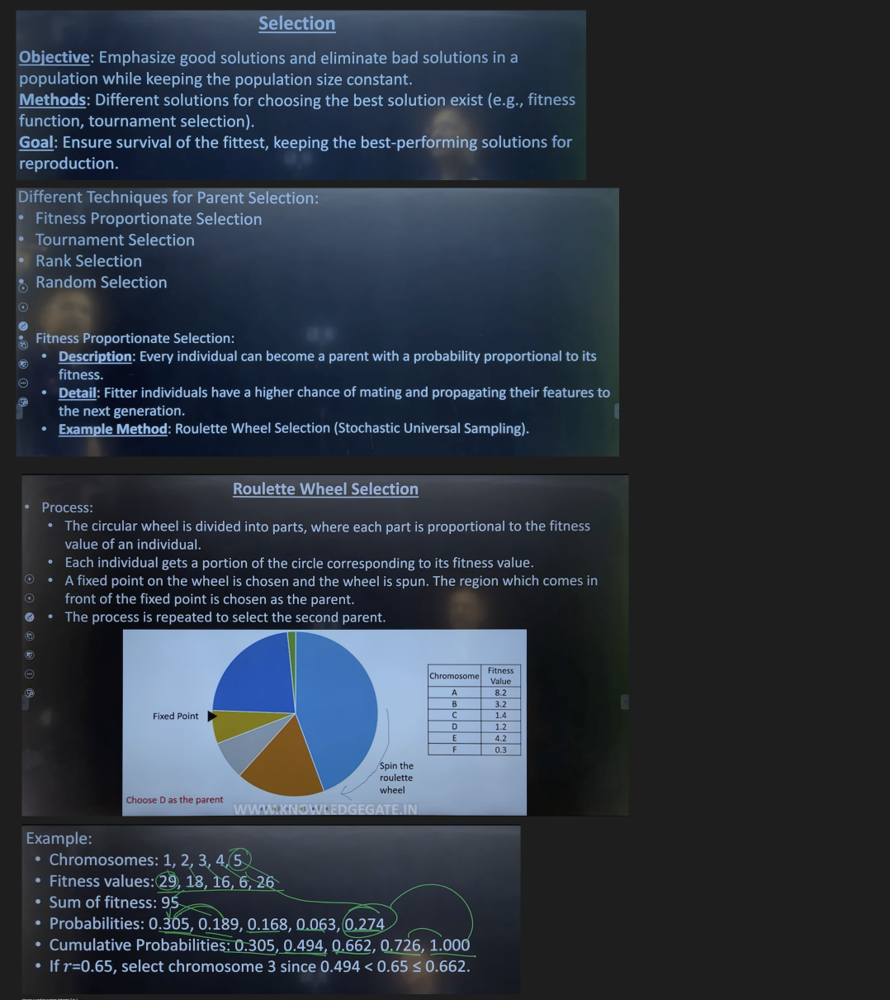

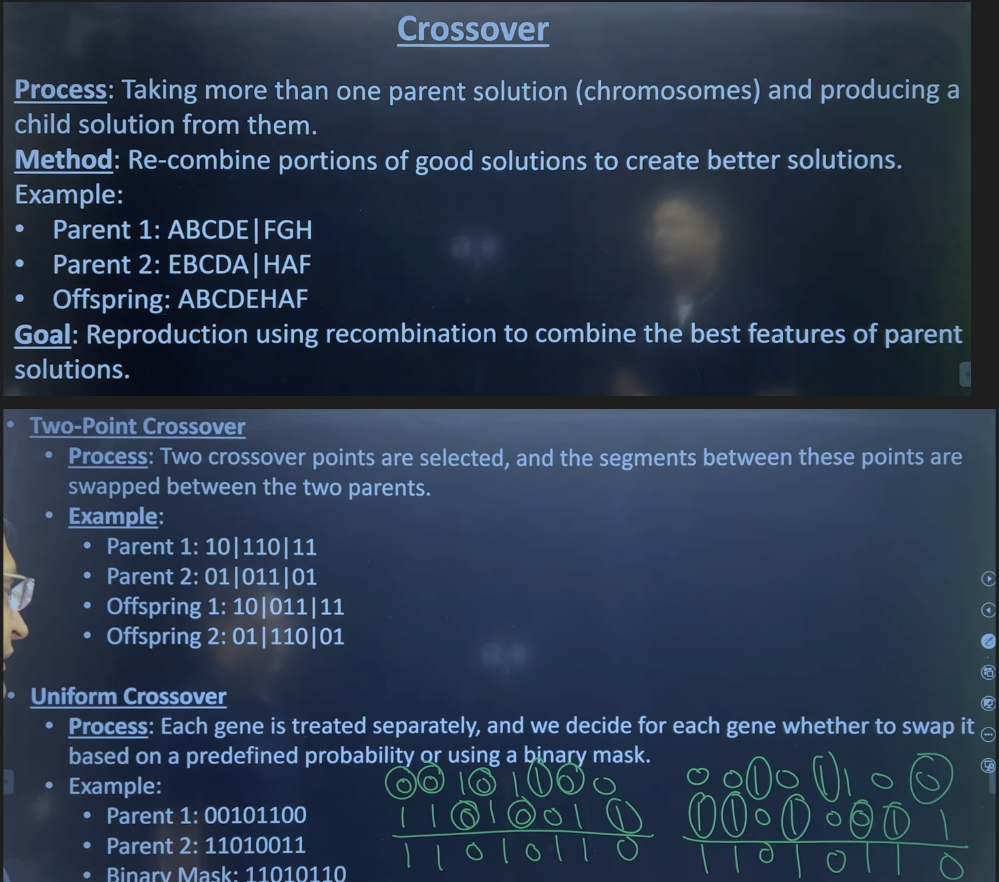

In [1]:
# binary mask: 11010110 (biased to parent 1)

# 1 means from parent 1 and 0 means from parent 2

# therefore 
# mask:11010110
# 00101100
# 11010011 ->  00000101 (child1)


# biased to parent 2: 1 means from parent 2 and 0 from parent 1

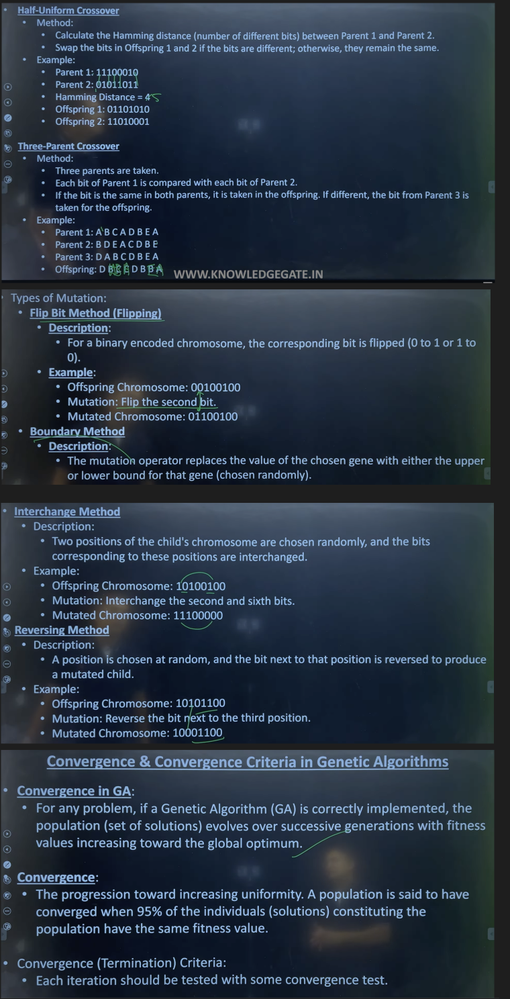

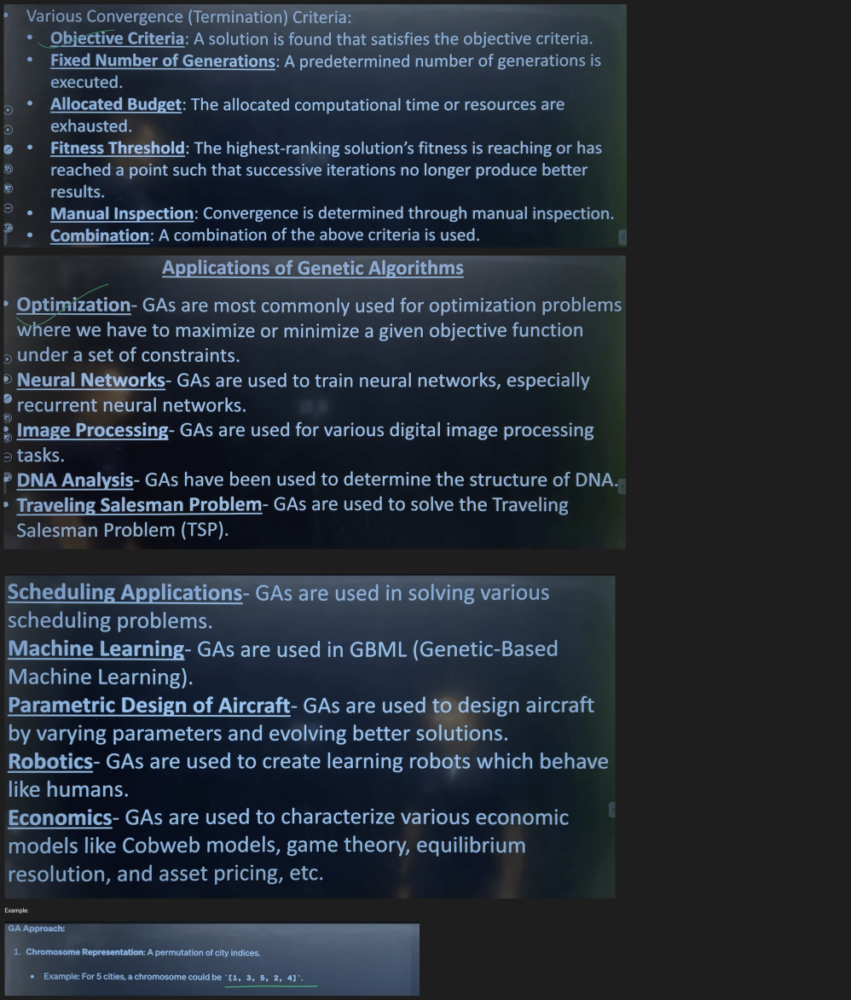

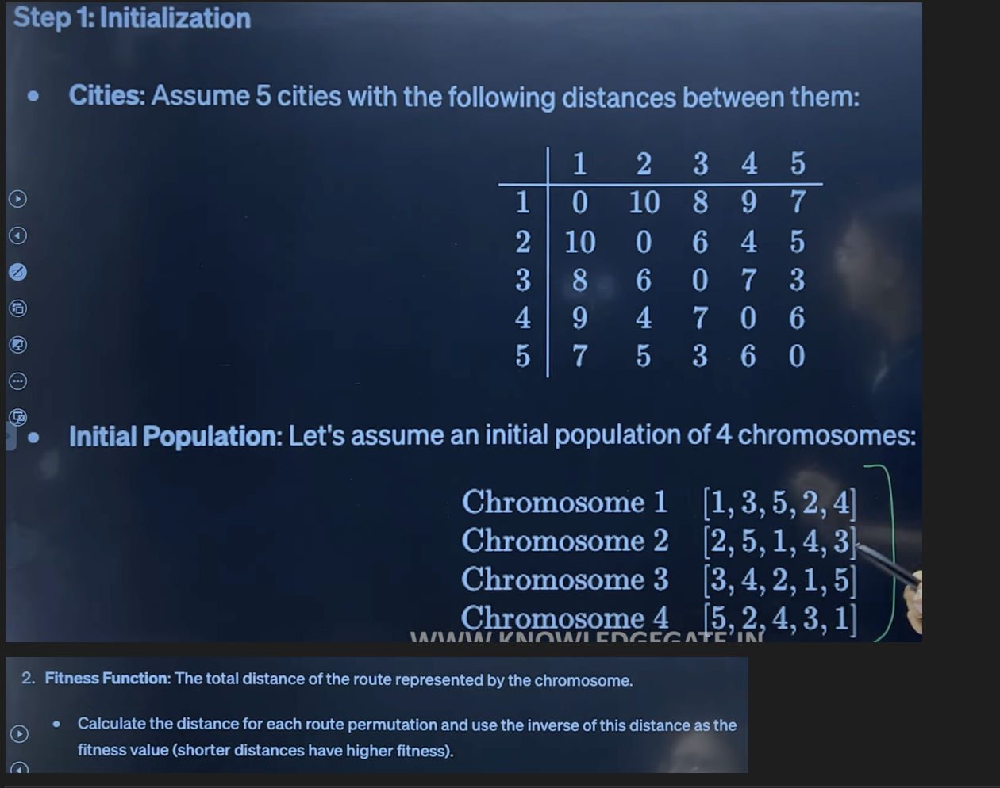

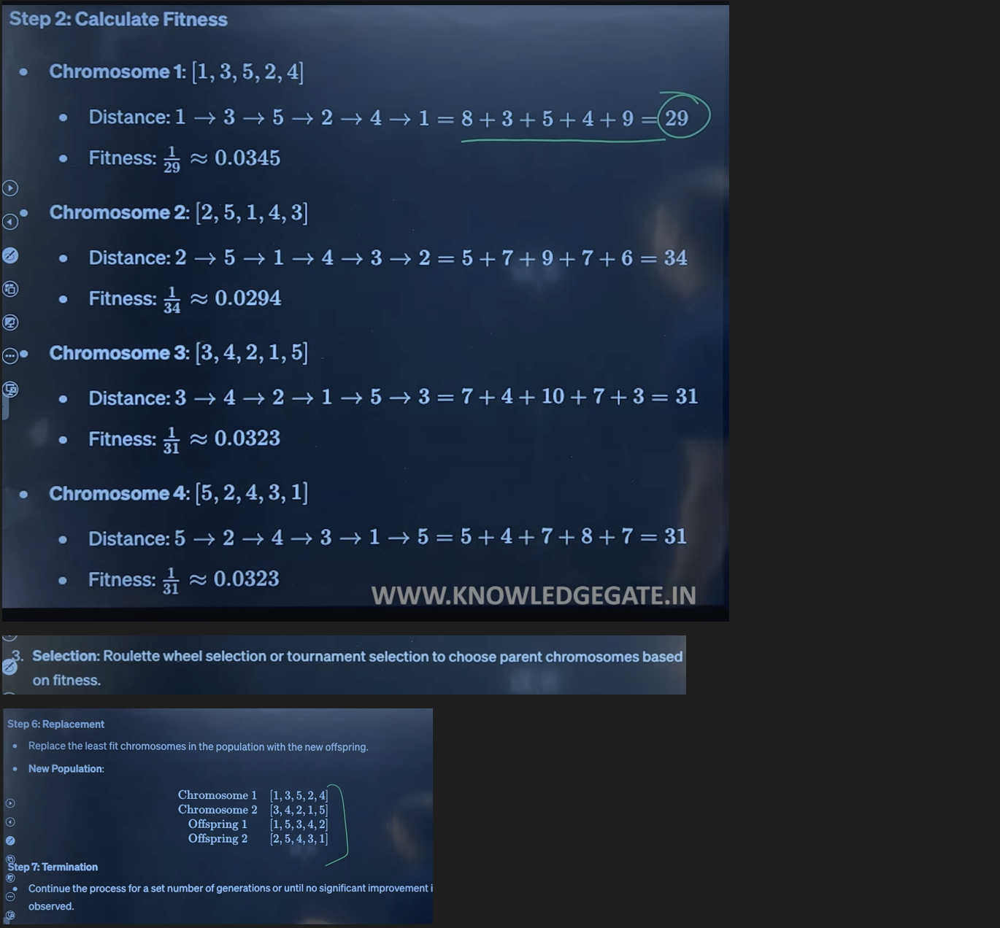

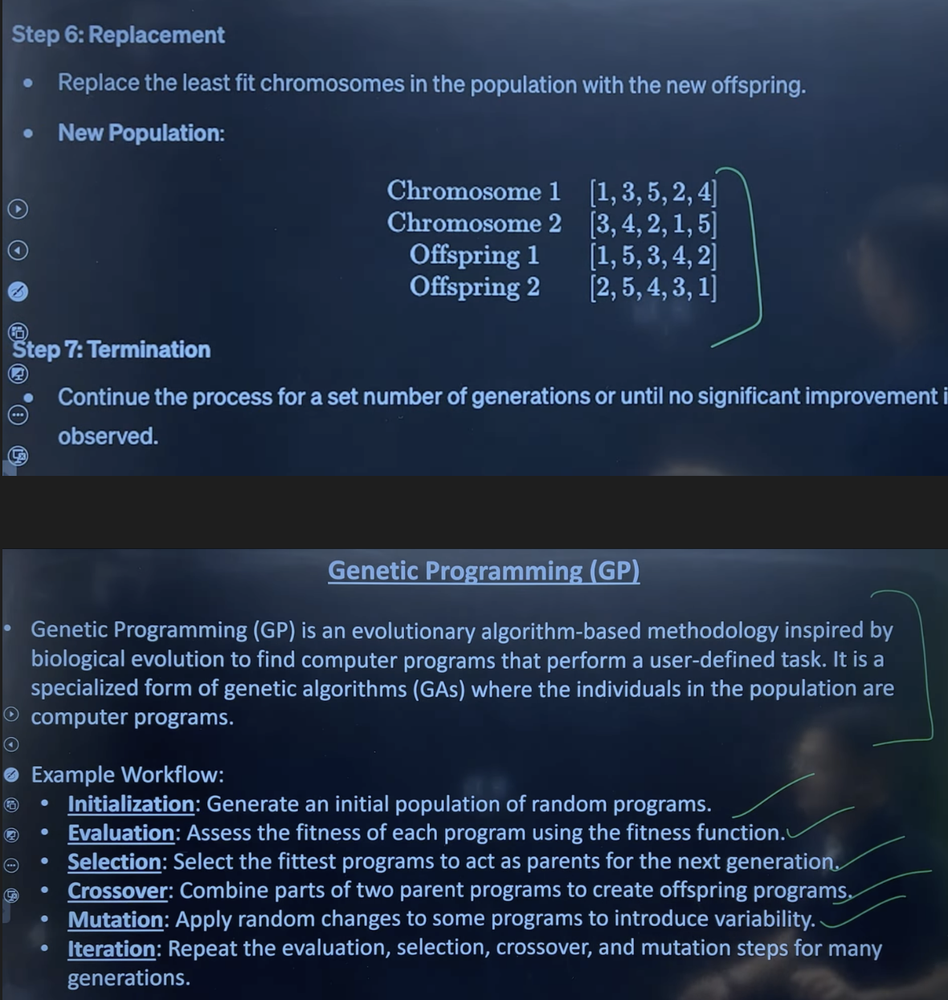

In [ ]:
## Python Implementation 
# ( we are solving x**2 and x ranges from 1 to 31)

import random


POP_SIZE=10
GENES=9
MUTATION_RATE=0.1
GENERATIONS=30


## Step 1:create random chromosomes (chromose in one solution)

def random_chromosome():
    return [random.randint(0,1) for x in range(GENES)]
## Creates like this [1,0,1,0,0]


## Step 2: Initial Population

population=[random_chromosome() for x in range(POP_SIZE)]
## creates a 2d list like this if POP_SIZE=5:
#[[1,0,1,0,0],[1,1,1,1,0],[0,0,0,1,1],[1,1,0,1,0],[0,0,1,0,1]]
# Each list is a chromosome


## Step 3: Fitness Function

def fitness(chromosome):
    x= "".join(map(str,chromosome)) ## x becomes like this '10100'
    x=int(x,2) ## 10100 ->20
    return x**2

## Step 4: Selection (Tournament)

def selection(population):
    tournament=random.sample(population,3)
    ## select three chromosomes out of POP_SIZE=10 chromosomes

    tournament.sort(key=fitness,reverse=True)
    return tournament[0]
   ## out of 3 chromosome , only 1 chromosome is selected who has the highest fitness
   ## ex: 10110->fit=484, 11110->fit=900, 00101->fit=25
   ## we sort by fitness -> 11110,10110,00101.. first chromosome is [1,1,1,1,0] selected


## Step 5: Single Point Crossover

def crossover(parent1,parent2):
    point=random.randint(1,GENES-1)
    child1=parent1[:point]+parent2[point:]
    child2=parent2[:point]+parent1[point:]
    return child1,child2
## p1 is a like this [0,1,1,1,0]
# spse point=3
## parent1 : 101|10  and parent2: 111|00
## child1: 10100 and child2:11100


## Step 6: Mutation

def mutation(chromosome):
    for i in range(GENES):
        if random.random() < MUTATION_RATE:
            chromosome[i]=chromosome[i]^1
    return chromosome
## we get [1,0,1,1,0] spse 4th bit mutates 10110->10100
## operator ^=1 flips a bit



for generation in range(GENERATIONS): ## Iterate this over 30 times
    population.sort(key=fitness,reverse=True)
    best=population[0]
    x=int("".join(map(str,best)),2)
    print(
        f"Generation {generation}: ",
        f"x= {x}",
        f"fitness={fitness(best)}"
            )
    new_population=[]
    while len(new_population) < POP_SIZE:
        p1=selection(population)
        p2=selection(population)

        c1,c2= crossover(p1,p2)
        mutation(c1)
        mutation(c2)

        new_population.extend([c1,c2])
    ## Step 7: Replacement
    ## after enough children are created,they replace the old population
    population=new_population[:POP_SIZE]

population.sort(key=fitness,reverse=True)
best=population[0]
print("\n Best Solution")
print(best)
print(int("".join(map(str,best)),2))

Generation 0:  x= 463 fitness=214369
Generation 1:  x= 500 fitness=250000
Generation 2:  x= 500 fitness=250000
Generation 3:  x= 500 fitness=250000
Generation 4:  x= 504 fitness=254016
Generation 5:  x= 506 fitness=256036
Generation 6:  x= 511 fitness=261121
Generation 7:  x= 509 fitness=259081
Generation 8:  x= 510 fitness=260100
Generation 9:  x= 510 fitness=260100
Generation 10:  x= 510 fitness=260100
Generation 11:  x= 510 fitness=260100
Generation 12:  x= 510 fitness=260100
Generation 13:  x= 510 fitness=260100
Generation 14:  x= 510 fitness=260100
Generation 15:  x= 510 fitness=260100
Generation 16:  x= 510 fitness=260100
Generation 17:  x= 510 fitness=260100
Generation 18:  x= 510 fitness=260100
Generation 19:  x= 508 fitness=258064
Generation 20:  x= 511 fitness=261121
Generation 21:  x= 511 fitness=261121
Generation 22:  x= 511 fitness=261121
Generation 23:  x= 511 fitness=261121
Generation 24:  x= 511 fitness=261121
Generation 25:  x= 509 fitness=259081
Generation 26:  x= 511

## Advantages:

1-Works for non linear and non differentiable problems

2-Can escape local optima through crossover and mutation

3-Handles discrete, continuous and mixed variable optimization

4- Naturally parallelizable bcz many chromosomes can be evaulvated simultaneously

## Limitation:

1-No gurantee of finding the global optimum

2-Fitness function evulations can be expensive

3-Performance depends heavily on parameter choices(POP_SIZE,MUTATION_RATE,CROSSOVER_RATE,SELECTION STRATEGY)

4-Can converge prematurely if diversity is lost



## Time Complexity

Let:
    
   P=population size

   G=no of generations

   L= chromosome length

Approximate Complexity:

1-Fitness Evaulation: O(P * L)

2- Selection: O(P)

3- CrossOver: O(P*L)

4- Mutation O(P*L)

Overall:

O(G X P X L)